In [0]:
from pyspark.sql.types import StructField, StructType, StringType, IntegerType, DoubleType, DateType, BooleanType, DecimalType
from pyspark.sql.functions import col, when, avg, row_number, sum
from pyspark.sql.window import Window

In [0]:
from pyspark.sql import SparkSession

#create session
spark = SparkSession.builder.appName("IPL Analysis").getOrCreate()

Define the structure schema and read data to data frame

In [0]:
ball_by_ball_schema = StructType([
    StructField("match_id", IntegerType(), True),
    StructField("over_id", IntegerType(), True),
    StructField("ball_id", IntegerType(), True),
    StructField("innings_no", IntegerType(), True),
    StructField("team_batting", StringType(), True),
    StructField("team_bowling", StringType(), True),
    StructField("striker_batting_position", IntegerType(), True),
    StructField("extra_type", StringType(), True),
    StructField("runs_scored", IntegerType(), True),
    StructField("extra_runs", IntegerType(), True),
    StructField("wides", IntegerType(), True),
    StructField("legbyes", IntegerType(), True),
    StructField("byes", IntegerType(), True),
    StructField("noballs", IntegerType(), True),
    StructField("penalty", IntegerType(), True),
    StructField("bowler_extras", IntegerType(), True),
    StructField("out_type", StringType(), True),
    StructField("caught", BooleanType(), True),
    StructField("bowled", BooleanType(), True),
    StructField("run_out", BooleanType(), True),
    StructField("lbw", BooleanType(), True),
    StructField("retired_hurt", BooleanType(), True),
    StructField("stumped", BooleanType(), True),
    StructField("caught_and_bowled", BooleanType(), True),
    StructField("hit_wicket", BooleanType(), True),
    StructField("obstructingfeild", BooleanType(), True),
    StructField("bowler_wicket", BooleanType(), True),
    StructField("match_date", DateType(), True),
    StructField("season", IntegerType(), True),
    StructField("striker", IntegerType(), True),
    StructField("non_striker", IntegerType(), True),
    StructField("bowler", IntegerType(), True),
    StructField("player_out", IntegerType(), True),
    StructField("fielders", IntegerType(), True),
    StructField("striker_match_sk", IntegerType(), True),
    StructField("strikersk", IntegerType(), True),
    StructField("nonstriker_match_sk", IntegerType(), True),
    StructField("nonstriker_sk", IntegerType(), True),
    StructField("fielder_match_sk", IntegerType(), True),
    StructField("fielder_sk", IntegerType(), True),
    StructField("bowler_match_sk", IntegerType(), True),
    StructField("bowler_sk", IntegerType(), True),
    StructField("playerout_match_sk", IntegerType(), True),
    StructField("battingteam_sk", IntegerType(), True),
    StructField("bowlingteam_sk", IntegerType(), True),
    StructField("keeper_catch", BooleanType(), True),
    StructField("player_out_sk", IntegerType(), True),
    StructField("matchdatesk", DateType(), True)
])

ball_by_ball_df = spark.read.schema(ball_by_ball_schema).format("csv").option("header", "true").load("s3a://ipl-data-arshad/Ball_By_Ball.csv")

In [0]:
match_schema = StructType([
    StructField("match_sk", IntegerType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("team1", StringType(), True),
    StructField("team2", StringType(), True),
    StructField("match_date", DateType(), True),
    StructField("season_year", IntegerType(), True),  # 'year' mapped to IntegerType
    StructField("venue_name", StringType(), True),
    StructField("city_name", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("toss_winner", StringType(), True),
    StructField("match_winner", StringType(), True),
    StructField("toss_name", StringType(), True),
    StructField("win_type", StringType(), True),
    StructField("outcome_type", StringType(), True),
    StructField("manofmach", StringType(), True),
    StructField("win_margin", IntegerType(), True),
    StructField("country_id", IntegerType(), True)
])

match_df = spark.read.schema(match_schema).format("csv").option("header", "true").load("s3a://ipl-data-arshad/Match.csv")

In [0]:
player_schema = StructType([
    StructField("player_sk", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True)
])

player_df = spark.read.schema(player_schema).format("csv").option("header", "true").load("s3a://ipl-data-arshad/Player.csv")

In [0]:
player_match_schema = StructType([
    StructField("player_match_sk", IntegerType(), True),
    StructField("playermatch_key", DecimalType(38,10), True),  # assuming high precision
    StructField("match_id", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("role_desc", StringType(), True),
    StructField("player_team", StringType(), True),
    StructField("opposit_team", StringType(), True),
    StructField("season_year", IntegerType(), True),  # 'year' mapped to IntegerType
    StructField("is_manofthematch", BooleanType(), True),
    StructField("age_as_on_match", IntegerType(), True),
    StructField("isplayers_team_won", BooleanType(), True),
    StructField("batting_status", StringType(), True),
    StructField("bowling_status", StringType(), True),
    StructField("player_captain", StringType(), True),
    StructField("opposit_captain", StringType(), True),
    StructField("player_keeper", StringType(), True),
    StructField("opposit_keeper", StringType(), True)
])

player_match_df = spark.read.schema(player_match_schema).format("csv").option("header", "true").load("s3a://ipl-data-arshad/Player_match.csv")

In [0]:
team_schema = StructType([
    StructField("team_sk", IntegerType(), True),
    StructField("team_id", IntegerType(), True),
    StructField("team_name", StringType(), True)
])

team_df = spark.read.schema(team_schema).format("csv").option("header", "true").load("s3a://ipl-data-arshad/Team.csv")

In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+
|match_id|over_id|ball_id|innings_no|team_batting|team_bowling|striker_batting_position|extra_type|runs_scored|extra_runs|wides|legbyes|byes|noballs|penalty|bowler_extras|      out_type|caught|bowled|run_out| lbw|retired_hurt|stumped|caught_and_bowled|hit_wicket|obstructingfeild|bowler_wicket|match_date|season|striker|non_striker|bowler|player_out|fielders|striker_match_sk|strikersk|nonstriker_match_sk|nonstriker_sk|fielder_match_sk|

**Transformation**


In [0]:
#filter to include only valid deliveries (exclude extras like wide and no ball)
ball_by_ball_df = ball_by_ball_df.filter(
    (col("wides") == 0) & (col("noballs") == 0)
)

#Aggregation: Calculating the total and average runs scored in each match and innings
total_and_avg_runs = ball_by_ball_df.groupBy("match_id", "innings_no").agg(
    sum("runs_scored").alias("total_runs"),
    avg("runs_scored").alias("avg_runs")
)
display(total_and_avg_runs)

match_id,innings_no,total_runs,avg_runs
548339,1,156,1.3109243697478992
548330,1,83,0.7155172413793104
548351,2,91,0.8348623853211009
980942,2,163,1.393162393162393
548328,2,123,1.025
734018,2,129,1.084033613445378
548344,2,161,1.3529411764705883
548316,2,115,1.116504854368932
729316,1,129,1.075
980966,1,143,1.1916666666666667


In [0]:
#Window function: Calculting running total of runs for each match for each over
windowspec = Window.partitionBy("match_id", "innings_no").orderBy("over_id")

running_total = ball_by_ball_df.withColumn("running_total",sum("runs_scored").over(windowspec))

In [0]:
#conditional formatting: flag for high impact balls (either a wicket or more than 6 runs including extras)
ball_by_ball_df = ball_by_ball_df.withColumn(
    "high_impact",
    when(
        (col("runs_scored") + col("extra_runs") > 6) | (col("bowler_wicket") == True),
        True
    ).otherwise(False)
)


In [0]:
ball_by_ball_df.display(5)

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk,high_impact
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,null,0,null,false
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null,false
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null,false
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null,false
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null,false
598028,14,5,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null,false
598028,14,6,1,5,2,3,No Extras,2,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null,false
598028,13,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,83,null,null,20333,103,20328,5,-1,-1,20343,82,-1,4,1,null,0,null,false
598028,13,2,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,null,0,null,false
598028,13,3,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,null,0,null,false


In [0]:
from pyspark.sql.functions import year, month, dayofmonth, when

# Extracting year, month, and day from the match date for more detailed time-based analysis
match_df = match_df.withColumn("year", year("match_date"))
match_df = match_df.withColumn("month", month("match_date"))
match_df = match_df.withColumn("day", dayofmonth("match_date"))

# High margin win: categorizing win margins into 'high', 'medium', and 'low'
match_df = match_df.withColumn(
    "win_margin_category",
    when(col("win_margin") >= 100, "High")
    .when((col("win_margin") >= 50) & (col("win_margin") < 100), "Medium")
    .otherwise("Low")
)

# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn(
    "toss_match_winner",
    when(col("toss_winner") == col("match_winner"), "Yes").otherwise("No")
)

# Show the enhanced match DataFrame
match_df.show(5)


+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-----------+----------+----------+----+-----+----+-------------------+-----------------+
|match_sk|match_id|               team1|               team2|match_date|season_year|          venue_name| city_name|country_name|         toss_winner|        match_winner|toss_name|win_type|outcome_type|  manofmach|win_margin|country_id|year|month| day|win_margin_category|toss_match_winner|
+--------+--------+--------------------+--------------------+----------+-----------+--------------------+----------+------------+--------------------+--------------------+---------+--------+------------+-----------+----------+----------+----+-----+----+-------------------+-----------------+
|       0|  335987|Royal Challengers...|Kolkata Knight Ri...|      NULL|       2008|M Chinnaswamy Sta...| Bangalore|       I

In [0]:
from pyspark.sql.functions import lower, regexp_replace

# Normalize and clean player names
player_df = player_df.withColumn("player_name", lower(regexp_replace("player_name", "[^a-zA-Z0-9 ]", "")))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unknown'
player_df = player_df.na.fill({"batting_hand": "unknown", "bowling_skill": "unknown"})

# Categorizing players based on batting hand
player_df = player_df.withColumn(
    "batting_style",
    when(col("batting_hand").contains("left"), "Left-Handed").otherwise("Right-Handed")
)

# Show the modified player DataFrame
player_df.show(5)

+---------+---------+---------------+----+--------------+------------------+------------+-------------+
|player_sk|player_id|    player_name| dob|  batting_hand|     bowling_skill|country_name|batting_style|
+---------+---------+---------------+----+--------------+------------------+------------+-------------+
|        0|        1|     sc ganguly|NULL| Left-hand bat|  Right-arm medium|       India| Right-Handed|
|        1|        2|    bb mccullum|NULL|Right-hand bat|  Right-arm medium| New Zealand| Right-Handed|
|        2|        3|     rt ponting|NULL|Right-hand bat|  Right-arm medium|   Australia| Right-Handed|
|        3|        4|      dj hussey|NULL|Right-hand bat|Right-arm offbreak|   Australia| Right-Handed|
|        4|        5|mohammad hafeez|NULL|Right-hand bat|Right-arm offbreak|    Pakistan| Right-Handed|
+---------+---------+---------------+----+--------------+------------------+------------+-------------+
only showing top 5 rows


In [0]:
from pyspark.sql.functions import col, when, current_date, expr

# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn(
    "veteran_status",
    when(col("age_as_on_match") >= 35, "Veteran").otherwise("Non-Veteran")
)

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn(
    "years_since_debut",
    (year(current_date()) - col("season_year"))
)

# Show the enriched DataFrame
player_match_df.show(5)


+---------------+--------------------+--------+---------+-----------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+--------------+-----------------+
|player_match_sk|     playermatch_key|match_id|player_id|player_name| dob|  batting_hand|       bowling_skill|country_name|role_desc|         player_team|        opposit_team|season_year|is_manofthematch|age_as_on_match|isplayers_team_won|batting_status|bowling_status|player_captain|opposit_captain|player_keeper|opposit_keeper|veteran_status|years_since_debut|
+---------------+--------------------+--------+---------+-----------+----+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+-----

**SQL Analysis**

In [0]:
#converting dataframe to sql table type format

ball_by_ball_df.createOrReplaceTempView("ball_by_ball")
match_df.createOrReplaceTempView("match")
player_df.createOrReplaceTempView("player")
player_match_df.createOrReplaceTempView("player_match")
team_df.createOrReplaceTempView("team")


In [0]:
# top batsman per season
top_scoring_batsman_per_season = spark.sql("""
select p.player_name, m.season_year, SUM(b.runs_scored) as total_runs 
from ball_by_ball b
join match m on b.match_id=m.match_id
join player_match pm on m.match_id=pm.match_id and b.striker=pm.player_id 
join player p on p.player_id=pm.player_id
group by p.player_name, m.season_year
order by m.season_year, total_runs desc
""")

top_scoring_batsman_per_season.show(5)

+-------------+-----------+----------+
|  player_name|season_year|total_runs|
+-------------+-----------+----------+
|     se marsh|       2008|       614|
|    g gambhir|       2008|       532|
|st jayasuriya|       2008|       508|
|    sr watson|       2008|       463|
|     gc smith|       2008|       437|
+-------------+-----------+----------+
only showing top 5 rows


In [0]:
# top batsmans who scored more runs in season 2015
top_scoring_batsman_per_season = spark.sql("""
select p.player_name, m.season_year, SUM(b.runs_scored) as total_runs 
from ball_by_ball b
join match m on b.match_id=m.match_id
join player_match pm on m.match_id=pm.match_id and b.striker=pm.player_id 
join player p on p.player_id=pm.player_id
where m.season_year=2015
group by p.player_name, m.season_year
order by m.season_year, total_runs desc
""")

top_scoring_batsman_per_season.show(5)

+--------------+-----------+----------+
|   player_name|season_year|total_runs|
+--------------+-----------+----------+
|     da warner|       2015|       554|
|     am rahane|       2015|       540|
|   lmp simmons|       2015|       540|
|ab de villiers|       2015|       511|
|       v kohli|       2015|       505|
+--------------+-----------+----------+
only showing top 5 rows


In [0]:
economical_bowler_powerplay = spark.sql("""
select p.player_name, avg(b.runs_scored) as avg_runs_per_ball, count(b.bowler_wicket) as total_wickets
from ball_by_ball b
join player_match pm on b.match_id=pm.match_id and b.bowler=pm.player_id
join player p on pm.player_id=p.player_id
where b.over_id<=6
group by p.player_name
having count(*)>120
order by avg_runs_per_ball, total_wickets desc
""")
economical_bowler_powerplay.show(5)

+---------------+------------------+-------------+
|    player_name| avg_runs_per_ball|total_wickets|
+---------------+------------------+-------------+
|smsm senanayake|0.8492063492063492|            0|
|      sp narine| 0.929718875502008|            0|
|     gd mcgrath|0.9324324324324325|            0|
|     sl malinga|0.9407630522088354|            0|
|  sohail tanvir| 0.946969696969697|            0|
+---------------+------------------+-------------+
only showing top 5 rows


In [0]:
#impact of toss on winning the game

toss_impact_individual_matches = spark.sql("""
select m.match_id, m.toss_winner, case when m.toss_winner = m.match_winner then "won" else "lost" end as match_outcome
from match m  
where m.toss_name is not null
order by m.match_id 
""")
toss_impact_individual_matches.show(5)

+--------+--------------------+-------------+
|match_id|         toss_winner|match_outcome|
+--------+--------------------+-------------+
|  335987|Royal Challengers...|         lost|
|  335988| Chennai Super Kings|          won|
|  335989|    Rajasthan Royals|         lost|
|  335990|      Mumbai Indians|         lost|
|  335991|     Deccan Chargers|         lost|
+--------+--------------------+-------------+
only showing top 5 rows


In [0]:
average_runs_in_a_win = spark.sql("""
select p.player_name, avg(b.runs_scored) as avg_runs_in_wins, count(*) as innings_played
from ball_by_ball b
join player_match pm on b.match_id=pm.match_id and b.striker=pm.player_id
join player p on pm.player_id=p.player_id
join match m on pm.match_id=m.match_id
where m.match_winner=pm.player_team
group by p.player_name
order by avg_runs_in_wins desc 
""")
average_runs_in_a_win.show(5)

+-------------+------------------+--------------+
|  player_name|  avg_runs_in_wins|innings_played|
+-------------+------------------+--------------+
|  rashid khan|               6.0|             1|
|shahid afridi|3.3333333333333335|             6|
|     ba bhatt|               3.0|             2|
|     an ahmed|               3.0|             3|
|      sn khan|2.5789473684210527|            19|
+-------------+------------------+--------------+
only showing top 5 rows


**Visualizatoin**

In [0]:
import matplotlib.pyplot as plt

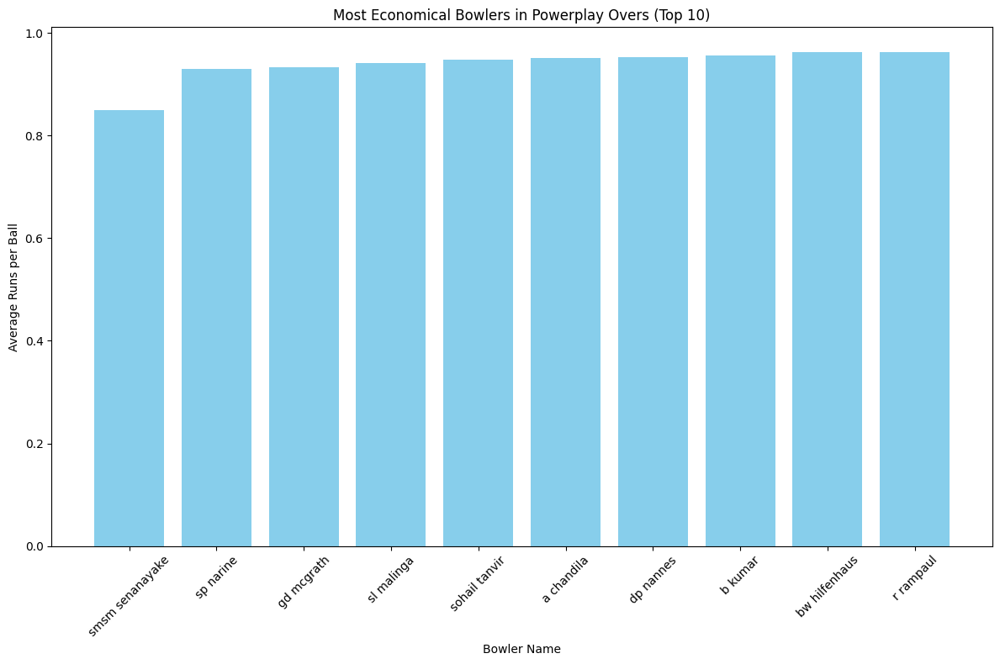

In [0]:
# assuming 'economical_bowlers_powerplay' is already executed and available as a spark dataframe
economical_bowlers_pd = economical_bowler_powerplay.toPandas()

# visualizing using matplotlib
plt.figure(figsize=(12, 8))
# limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_runs_per_ball'], color='skyblue')
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (Top 10)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [0]:
import seaborn as sns

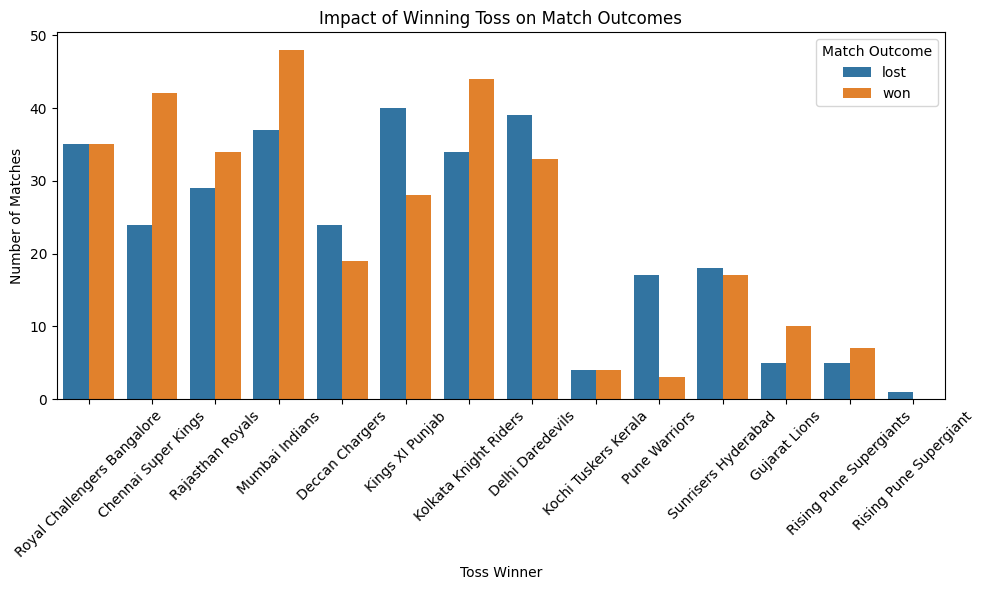

In [0]:
toss_impact_pd = toss_impact_individual_matches.toPandas()

# creating a countplot to show win/loss after winning toss
plt.figure(figsize=(10, 6))
sns.countplot(x='toss_winner', hue='match_outcome', data=toss_impact_pd)
plt.title('Impact of Winning Toss on Match Outcomes')
plt.xlabel('Toss Winner')
plt.ylabel('Number of Matches')
plt.legend(title='Match Outcome')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

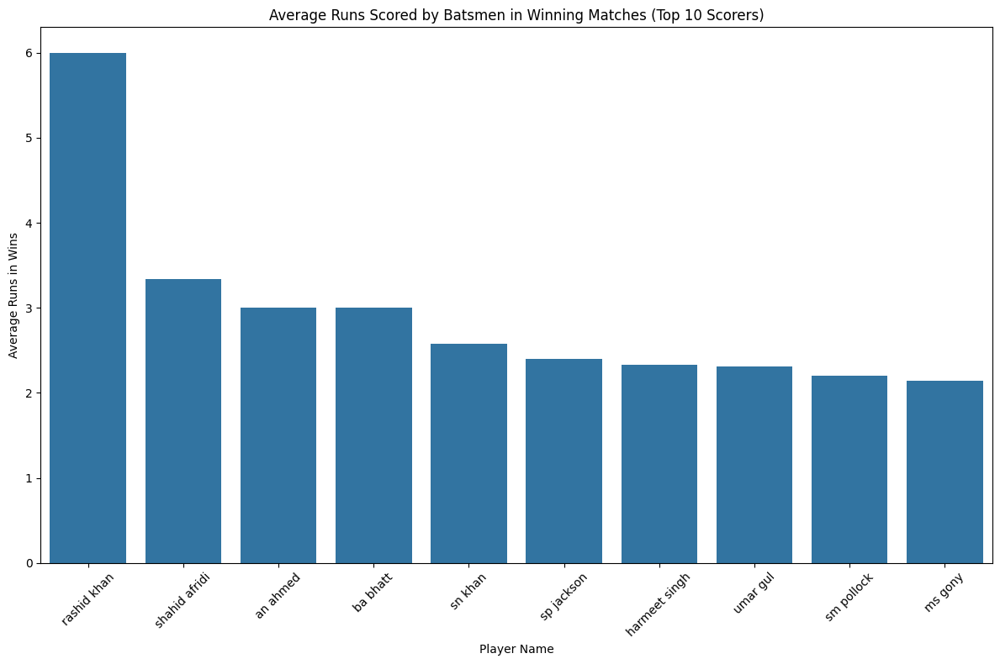

In [0]:
average_runs_pd = average_runs_in_a_win.toPandas()

# using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [0]:
# executing sql query to find scores per venue
scores_by_venue = spark.sql("""
SELECT venue_name, AVG(total_runs) AS average_score, MAX(total_runs) AS highest_score
FROM (
    SELECT ball_by_ball.match_id, match.venue_name, SUM(runs_scored) AS total_runs
    FROM ball_by_ball
    JOIN match ON ball_by_ball.match_id = match.match_id
    GROUP BY ball_by_ball.match_id, match.venue_name
)
GROUP BY venue_name
ORDER BY average_score DESC
""")
scores_by_venue.show(5)

+--------------------+------------------+-------------+
|          venue_name|     average_score|highest_score|
+--------------------+------------------+-------------+
|   Brabourne Stadium| 325.8181818181818|          399|
|Saurashtra Cricke...|             319.1|          393|
|Punjab Cricket As...|317.42857142857144|          341|
|    Barabati Stadium|311.57142857142856|          404|
|          Green Park|             308.0|          378|
+--------------------+------------------+-------------+
only showing top 5 rows


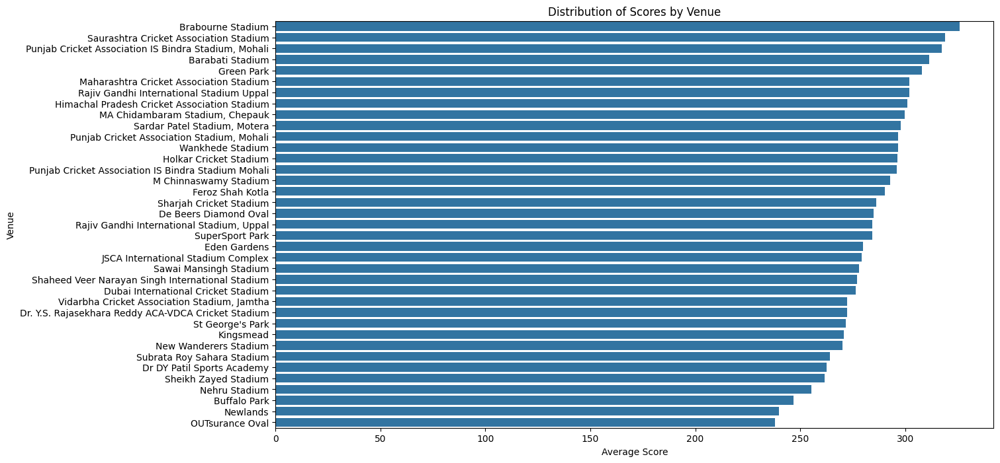

In [0]:
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()

In [0]:
# executing sql query for various dismissal types
dismissal_types = spark.sql("""
SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC
""")
dismissal_types.show(5)

+--------------+---------+
|      out_type|frequency|
+--------------+---------+
|Not Applicable|   137852|
|        caught|     3678|
|        bowled|     1382|
|       run out|      744|
|  Keeper Catch|      695|
+--------------+---------+
only showing top 5 rows


/home/spark-9fd9db58-e0fd-4f27-9cc1-c0/.ipykernel/2437/command-5333865811490547-1677582396:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')


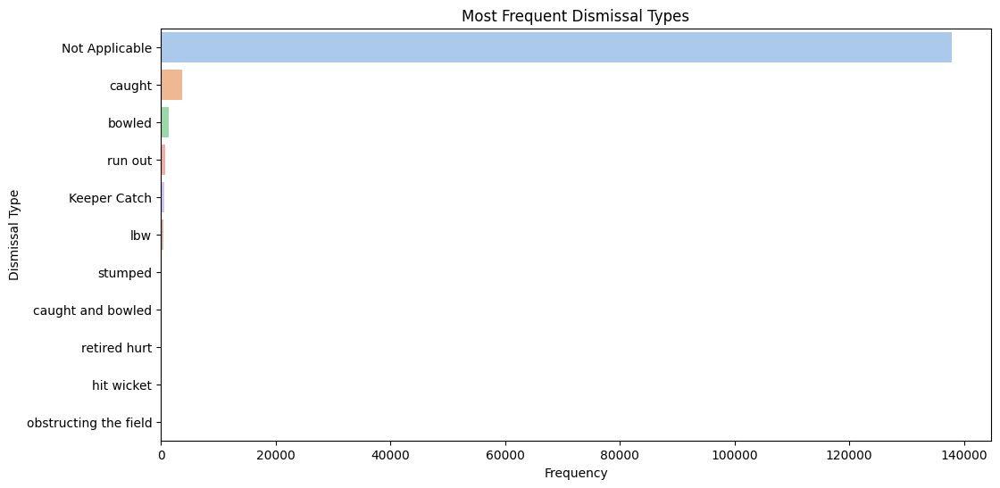

In [0]:
dismissal_types_pd = dismissal_types.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types')
plt.xlabel('Frequency')
plt.ylabel('Dismissal Type')
plt.show()

In [0]:
# executing sql query for team toss win performance
team_toss_win_performance = spark.sql("""
SELECT team1, COUNT(*) AS matches_played, SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM match
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")
team_toss_win_performance.show(5)

+--------------------+--------------+---------------+
|               team1|matches_played|wins_after_toss|
+--------------------+--------------+---------------+
| Chennai Super Kings|            37|             27|
|      Mumbai Indians|            42|             26|
|Kolkata Knight Ri...|            36|             24|
|Royal Challengers...|            34|             19|
|    Delhi Daredevils|            36|             17|
+--------------------+--------------+---------------+
only showing top 5 rows


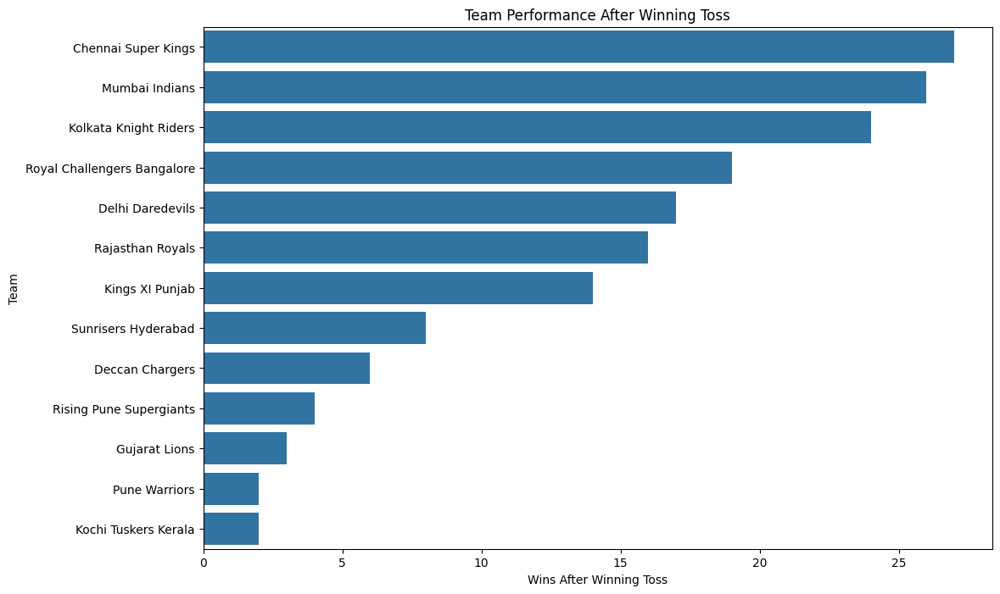

In [0]:
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()
